In [1]:
import geopandas as gpd
import pandas as pd
import xarray as xr
import numpy as np
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import RobustScaler
from sklearn.linear_model import HuberRegressor
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
from pykrige.ok import OrdinaryKriging
import mapbox
import plotly.graph_objs as go
import plotly.express as px
from global_land_mask import globe
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
import random



In [2]:
#load Dataset
ds_sst = xr.open_dataset('C:/Users/Acer/Documents/SchoolHard/Thesis/Code/dataset//sst_merged_2002_08_2022_10.nc')
ds_chl = xr.open_dataset('C:/Users/Acer/Documents/SchoolHard/Thesis/Code/dataset//chl_merged_2002_08_2022_10.nc')

In [3]:
#define time steps, 243 monthly observations
start_date = pd.Timestamp('2002-08-01')
end_date = pd.Timestamp('2022-10-01')

#Create a new time coordinate that represents the month and year
time_coords = pd.date_range(start=start_date, end=end_date, freq='MS')

In [4]:
# CHL START

In [5]:
#Select variable and extract time slice
month_chl = ds_chl['chlor_a'].sel(time= time_coords)

lon = ds_chl['lon'].values
lat = ds_chl['lat'].values

In [6]:
#Convert the chl dataset to a pandas dataframe
df_chl = month_chl.to_dataframe().reset_index()

In [7]:
#convert dataframe to geodataframe 
gdf_chl = gpd.GeoDataFrame(
    df_chl, 
    geometry=gpd.points_from_xy(df_chl.lon, df_chl.lat)
)

# Set the CRS of the geodataframe
gdf_chl.crs = 'WGS84'

In [8]:
#dropna in gdf
gdf_chl = gdf_chl.dropna()
gdf_chl

,time,lat,lon,chlor_a,geometry
407,2002-08-01,7.229164,125.645844,3.532537,POINT (125.64584 7.22916)
408,2002-08-01,7.229164,125.687508,2.929808,POINT (125.68751 7.22916)
409,2002-08-01,7.229164,125.729179,2.427371,POINT (125.72918 7.22916)
410,2002-08-01,7.229164,125.770844,0.289098,POINT (125.77084 7.22916)
411,2002-08-01,7.229164,125.812508,0.333985,POINT (125.81251 7.22916)
...,...,...,...,...,...
408963,2022-10-01,5.645831,126.312508,0.038899,POINT (126.31251 5.64583)
408964,2022-10-01,5.645831,126.354179,0.036646,POINT (126.35418 5.64583)
408965,2022-10-01,5.645831,126.395844,0.036137,POINT (126.39584 5.64583)
408966,2022-10-01,5.645831,126.437508,0.032445,POINT (126.43751 5.64583)


In [9]:
#Show characteristics of chl gdf
gdf_chl['chlor_a'].describe()

count    209648.000000
mean          0.231640
std           0.464878
min           0.021140
25%           0.077727
50%           0.131684
75%           0.222087
max          35.841854
Name: chlor_a, dtype: float64

In [10]:
# Calculate IQR of SSC
q1 = gdf_chl['chlor_a'].quantile(0.05)
q3 = gdf_chl['chlor_a'].quantile(0.95)
iqr = q3 - q1

# Identify outliers
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr
outliers = gdf_chl[(gdf_chl['chlor_a'] < lower_bound) | (gdf_chl['chlor_a'] > upper_bound)]

# Get number of outliers
num_outliers = outliers.count().sum()

print("Number of outliers:", num_outliers)

Number of outliers: 12910


In [9]:
#make date column for chl
gdf_chl["date"] = pd.to_datetime(gdf_chl["time"])

#split date column to year and month
gdf_chl["year"] = gdf_chl["date"].dt.year
gdf_chl["month"] = gdf_chl["date"].dt.month
gdf_chl

,time,lat,lon,chlor_a,geometry,date,year,month
407,2002-08-01,7.229164,125.645844,3.532537,POINT (125.64584 7.22916),2002-08-01,2002,8
408,2002-08-01,7.229164,125.687508,2.929808,POINT (125.68751 7.22916),2002-08-01,2002,8
409,2002-08-01,7.229164,125.729179,2.427371,POINT (125.72918 7.22916),2002-08-01,2002,8
410,2002-08-01,7.229164,125.770844,0.289098,POINT (125.77084 7.22916),2002-08-01,2002,8
411,2002-08-01,7.229164,125.812508,0.333985,POINT (125.81251 7.22916),2002-08-01,2002,8
...,...,...,...,...,...,...,...,...
408963,2022-10-01,5.645831,126.312508,0.038899,POINT (126.31251 5.64583),2022-10-01,2022,10
408964,2022-10-01,5.645831,126.354179,0.036646,POINT (126.35418 5.64583),2022-10-01,2022,10
408965,2022-10-01,5.645831,126.395844,0.036137,POINT (126.39584 5.64583),2022-10-01,2022,10
408966,2022-10-01,5.645831,126.437508,0.032445,POINT (126.43751 5.64583),2022-10-01,2022,10


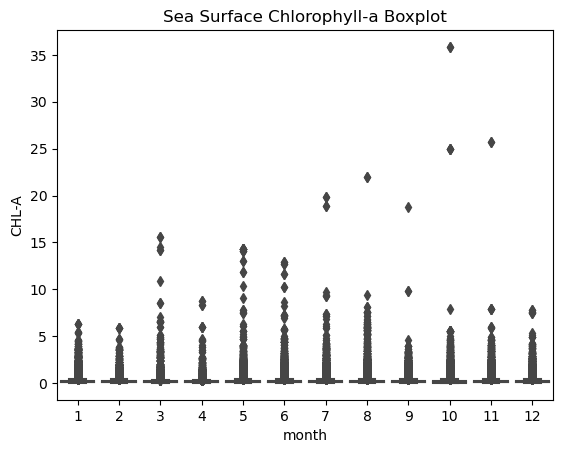

In [12]:
#make boxplot to identify characteristics of chlor_a data
ax = sns.boxplot(x="month", y="chlor_a", data=gdf_chl)

# Add title and y-axis label
ax.set_title("Sea Surface Chlorophyll-a Boxplot")
ax.set_ylabel("CHL-A")

# Rotate x-axis labels by 45 degrees
ax.set_xticklabels(ax.get_xticklabels())

# Show plot
plt.show()

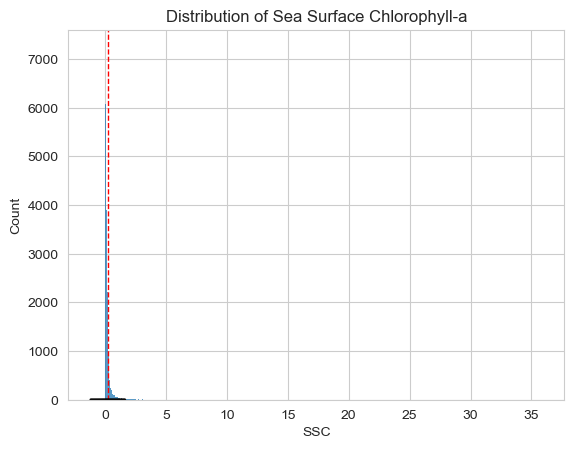

In [11]:
# Assuming you have loaded your data into a GeoDataFrame called 'gdf'
ssc_data = gdf_chl['chlor_a']

# Calculate mean and standard deviation of the data
mean_ssc = ssc_data.mean()
std_ssc = ssc_data.std()

# Create normal distribution curve
x = np.linspace(mean_ssc - 3*std_ssc, mean_ssc + 3*std_ssc, 100)
y = 1/(std_ssc * np.sqrt(2*np.pi)) * np.exp(-(x-mean_ssc)**2 / (2*std_ssc**2))

# Plot histogram using Seaborn
sns.histplot(data=ssc_data, kde=False)

# Add vertical line at mean
plt.axvline(mean_ssc, color='r', linestyle='dashed', linewidth=1)

# Add normal distribution curve
sns.lineplot(x=x, y=y, color='k', linewidth=2)

# Set x-axis limits to 0-1
#plt.xlim([0, 1])

# Add labels and title
plt.xlabel('SSC')
plt.ylabel('Count')
plt.title('Distribution of Sea Surface Chlorophyll-a')

# Display plot
plt.show()


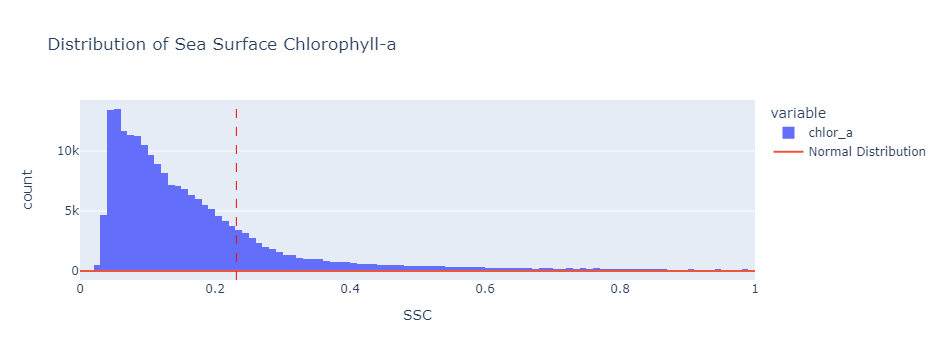

In [12]:
# Calculate mean and standard deviation of the data
mean_ssc = ssc_data.mean()
std_ssc = ssc_data.std()

# Create normal distribution curve
x = np.linspace(mean_ssc - 3*std_ssc, mean_ssc + 3*std_ssc, 100)
y = 1/(std_ssc * np.sqrt(2*np.pi)) * np.exp(-(x-mean_ssc)**2 / (2*std_ssc**2))

# Create histogram using Plotly Express
fig = px.histogram(ssc_data, labels={'value':'SSC', 'count':'Count'}, title='Distribution of Sea Surface Chlorophyll-a')

# Add vertical line at mean
fig.add_vline(x=mean_ssc, line_color='red', line_dash='dash', line_width=1)

# Add bell curve line
fig.add_trace(go.Scatter(x=x, y=y, mode='lines', name='Normal Distribution'))

# Set x-axis limits to 0-1
fig.update_layout(xaxis_range=[0, 1])

# Show the histogram
fig.show()

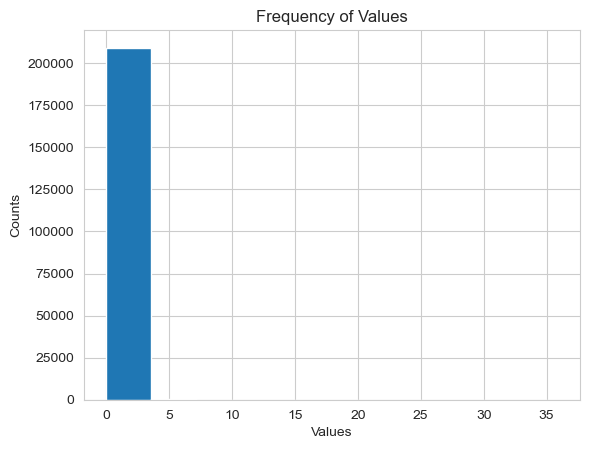

In [13]:
# Create a bar graph using pandas
ssc_data.plot(kind='hist')

# Set the labels and title
plt.xlabel('Values')
plt.ylabel('Counts')
plt.title('Frequency of Values')

# Display the graph
plt.show()

In [14]:
# data in a pandas Series called 'ssc_data'
ssc_data_rounded = ssc_data.round(1)
# count unique data
unique_counts = ssc_data_rounded.value_counts()
print(unique_counts)

0.100000     99241
0.200000     48925
0.000000     18596
0.300000     16346
0.400000      7094
             ...  
10.900000        1
9.700000         1
18.700001        1
6.200000         1
14.500000        1
Name: chlor_a, Length: 110, dtype: int64


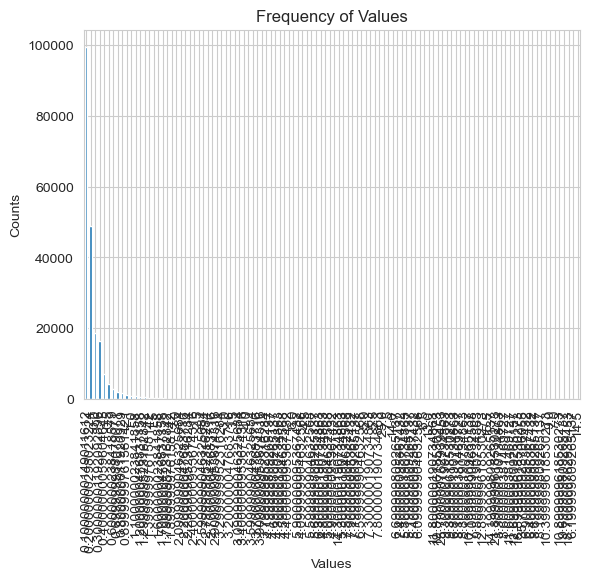

In [15]:
# Create a histogram using pandas
#unique_counts.hist()

# Create a horizontal bar graph using pandas
unique_counts.plot(kind='bar')

# set y lim
#plt.ylim([0, 5])

# Set the labels and title
plt.xlabel('Values')
plt.ylabel('Counts')
plt.title('Frequency of Values')

# Display the graph
plt.show()

In [16]:
# Filter the values between 0 and 1
ssc_data_filtered = ssc_data_rounded[(ssc_data_rounded >= 0) & (ssc_data_rounded <= 1)]

# Count unique data
unique_counts = ssc_data_filtered.value_counts()

# Print the unique counts
print(unique_counts)


0.1    99241
0.2    48925
0.0    18596
0.3    16346
0.4     7094
0.5     4337
0.6     2938
0.7     2165
0.8     1694
0.9     1259
1.0     1065
Name: chlor_a, dtype: int64


In [17]:
# count unique data
unique_counts = ssc_data.value_counts()
print(unique_counts)

0.095848    6
0.125754    6
0.146113    6
0.305844    6
0.304746    6
           ..
0.431525    1
0.420035    1
0.418540    1
0.335304    1
0.031243    1
Name: chlor_a, Length: 204709, dtype: int64


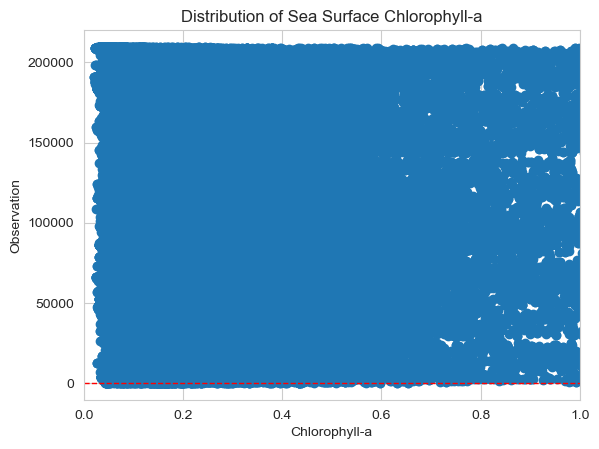

In [18]:
# Assuming you have loaded your data into a GeoDataFrame called 'gdf'
chlor_a_data = gdf_chl['chlor_a']

# Create point plot with x and y axis reversed
plt.plot(chlor_a_data, range(len(chlor_a_data)), 'o')

# Add horizontal line at mean
mean_chlor_a = chlor_a_data.mean()
plt.axhline(mean_chlor_a, color='r', linestyle='dashed', linewidth=1)

# Set x-axis limits to 1-10
plt.xlim([0, 1])

# Add labels and title
plt.xlabel('Chlorophyll-a')
plt.ylabel('Observation')
plt.title('Distribution of Sea Surface Chlorophyll-a')

# Display plot
plt.show()


<Axes: title={'center': 'SSC Lineplot'}, xlabel='month', ylabel='chlor_a'>

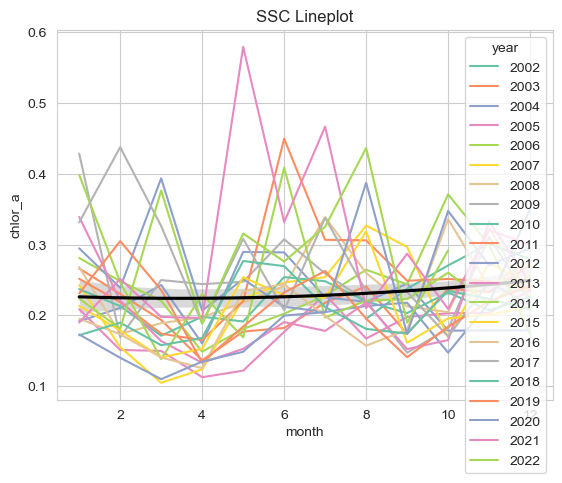

In [21]:
# Compute mean SSC for each year and month
grpd_gdf_mean_chl = gdf_chl.groupby(['year', 'month'])['chlor_a'].mean().reset_index()

# Create line plot with seaborn
sns.set_style('whitegrid')
sns.lineplot(x='month', y='chlor_a', hue='year', palette='Set2', data=grpd_gdf_mean_chl)

# Set title and y-axis label
plt.title('SSC Lineplot')
plt.ylabel('CHL-A')

# Add curvilinear trend line
sns.regplot(x='month', y='chlor_a', data=grpd_gdf_mean_chl, scatter=False, order=2, color='black')


In [22]:
# copy gdf data to not affect orig data
gdf_chl_copy = gdf_chl.copy()
gdf_chl_copy

,time,lat,lon,chlor_a,geometry,date,year,month
407,2002-08-01,7.229164,125.645844,3.532537,POINT (125.64584 7.22916),2002-08-01,2002,8
408,2002-08-01,7.229164,125.687508,2.929808,POINT (125.68751 7.22916),2002-08-01,2002,8
409,2002-08-01,7.229164,125.729179,2.427371,POINT (125.72918 7.22916),2002-08-01,2002,8
410,2002-08-01,7.229164,125.770844,0.289098,POINT (125.77084 7.22916),2002-08-01,2002,8
411,2002-08-01,7.229164,125.812508,0.333985,POINT (125.81251 7.22916),2002-08-01,2002,8
...,...,...,...,...,...,...,...,...
408963,2022-10-01,5.645831,126.312508,0.038899,POINT (126.31251 5.64583),2022-10-01,2022,10
408964,2022-10-01,5.645831,126.354179,0.036646,POINT (126.35418 5.64583),2022-10-01,2022,10
408965,2022-10-01,5.645831,126.395844,0.036137,POINT (126.39584 5.64583),2022-10-01,2022,10
408966,2022-10-01,5.645831,126.437508,0.032445,POINT (126.43751 5.64583),2022-10-01,2022,10


In [23]:
# apply Winsorization
# Q1 = gdf_copy.chlor_a.quantile(0.25)
# Q3 = gdf_copy.chlor_a.quantile(0.75)
# IQR = Q3 - Q1
# gdf_copy['chlor_a_winsorized'] = gdf_copy.chlor_a.clip(Q1 - 1.5*IQR, Q3 + 1.5*IQR)


In [24]:
# apply M-estimation
# c = 1.4826
# mad = np.median(np.abs(gdf_copy.chlor_a_winsorized - np.median(gdf_copy.chlor_a_winsorized)))
# gdf['M-est'] = c * (gdf_copy.chlor_a_winsorized - np.median(gdf_copy.chlor_a_winsorized)) / mad

In [25]:
# Calculate winsorized values
winsorized = np.clip(gdf_chl_copy['chlor_a'], gdf_chl_copy['chlor_a'].quantile(0.01), gdf_chl_copy['chlor_a'].quantile(0.95))

# Define Huber loss function
def huber_loss(residuals, c=1.345):
    return np.where(abs(residuals) < c, 0.5 * residuals ** 2, c * (abs(residuals) - 0.5 * c))

# Define M-estimator function
def m_estimator(data, loss_function, tuning_param):
    # Add a constant column to serve as the intercept
    exog = sm.add_constant(data)
    model = sm.RLM(gdf_chl_copy['chlor_a'], exog=exog, M=sm.robust.norms.HuberT(t=tuning_param))
    results = model.fit()
    return results.fittedvalues

# Apply M-estimator function to winsorized data
final_values = m_estimator(winsorized, huber_loss, 1.345)

# Add final values as a new column to your original GeoDataFrame
gdf_chl_copy['final_values'] = final_values

# Convert the 'final_values' column to float data type if necessary
gdf_chl_copy['final_values'] = gdf_chl_copy['final_values'].astype(float)

In [26]:
gdf_chl_copy['final_values'].describe()

count    209648.000000
mean          0.189903
std           0.172500
min           0.035616
25%           0.077727
50%           0.131684
75%           0.222087
max           0.725782
Name: final_values, dtype: float64

In [27]:
gdf_chl_copy['final_values'].describe()

count    209648.000000
mean          0.189903
std           0.172500
min           0.035616
25%           0.077727
50%           0.131684
75%           0.222087
max           0.725782
Name: final_values, dtype: float64

In [28]:
gdf_chl_copy

,time,lat,lon,chlor_a,geometry,date,year,month,final_values
407,2002-08-01,7.229164,125.645844,3.532537,POINT (125.64584 7.22916),2002-08-01,2002,8,0.725782
408,2002-08-01,7.229164,125.687508,2.929808,POINT (125.68751 7.22916),2002-08-01,2002,8,0.725782
409,2002-08-01,7.229164,125.729179,2.427371,POINT (125.72918 7.22916),2002-08-01,2002,8,0.725782
410,2002-08-01,7.229164,125.770844,0.289098,POINT (125.77084 7.22916),2002-08-01,2002,8,0.289098
411,2002-08-01,7.229164,125.812508,0.333985,POINT (125.81251 7.22916),2002-08-01,2002,8,0.333985
...,...,...,...,...,...,...,...,...,...
408963,2022-10-01,5.645831,126.312508,0.038899,POINT (126.31251 5.64583),2022-10-01,2022,10,0.038899
408964,2022-10-01,5.645831,126.354179,0.036646,POINT (126.35418 5.64583),2022-10-01,2022,10,0.036646
408965,2022-10-01,5.645831,126.395844,0.036137,POINT (126.39584 5.64583),2022-10-01,2022,10,0.036137
408966,2022-10-01,5.645831,126.437508,0.032445,POINT (126.43751 5.64583),2022-10-01,2022,10,0.035616


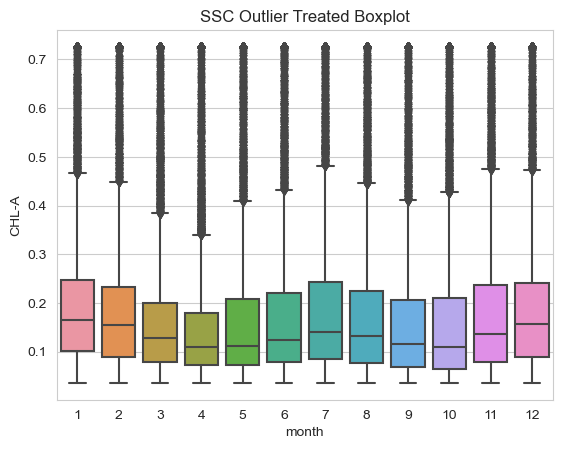

In [29]:
#make boxplot to identify characteristics of chlor_a data
ax = sns.boxplot(x="month", y="final_values", data=gdf_chl_copy)

# Add title and y-axis label
ax.set_title("SSC Outlier Treated Boxplot")
ax.set_ylabel("CHL-A")

# Rotate x-axis labels by 45 degrees
ax.set_xticklabels(ax.get_xticklabels())

# Show plot
plt.show()

<Axes: xlabel='month', ylabel='final_values'>

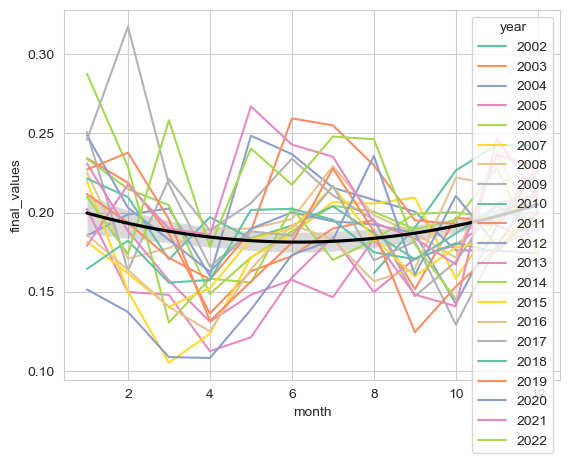

In [30]:
# Compute mean SSC for each year and month
grpd_gdf_mean_chl_copy = gdf_chl_copy.groupby(['year', 'month'])['final_values'].mean().reset_index()

# Create line plot with seaborn
sns.set_style('whitegrid')
sns.lineplot(x='month', y='final_values', hue='year', palette = "Set2", data=grpd_gdf_mean_chl_copy)
#sns.lineplot(x='month', y='chlor_a', hue='year', palette='Set2', data=grpd_gdf_mean_chl, order=2)

# Add curvilinear trend line
sns.regplot(x='month', y='final_values', data=grpd_gdf_mean_chl_copy, scatter=False, order=2, color='black')


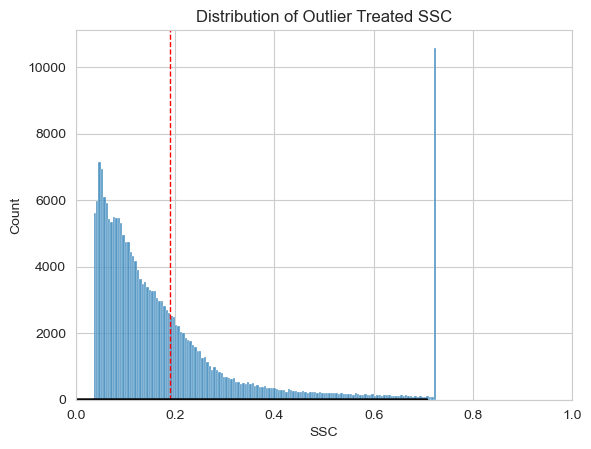

In [31]:
ssc_data_copy = gdf_chl_copy['final_values']

# Calculate mean and standard deviation of the data
mean_ssc_copy = ssc_data_copy.mean()
std_ssc_copy = ssc_data_copy.std()

# Create normal distribution curve
x = np.linspace(mean_ssc_copy - 3*std_ssc_copy, mean_ssc_copy + 3*std_ssc_copy, 100)
y = 1/(std_ssc_copy * np.sqrt(2*np.pi)) * np.exp(-(x-mean_ssc_copy)**2 / (2*std_ssc_copy**2))

# Plot histogram using Seaborn
sns.histplot(data=ssc_data_copy, kde=False)

# Add vertical line at mean
plt.axvline(mean_ssc_copy, color='r', linestyle='dashed', linewidth=1)

# Add normal distribution curve
sns.lineplot(x=x, y=y, color='k', linewidth=2)

# Set x-axis limits to 0-1
plt.xlim([0, 1])

# Add labels and title
plt.xlabel('SSC')
plt.ylabel('Count')
plt.title('Distribution of Outlier Treated SSC')

# Display plot
plt.show()

In [32]:
#Select variable and extract time slice
month_sst = ds_sst['sst'].sel(time= time_coords)

lon = ds_sst['lon'].values
lat = ds_sst['lat'].values

In [33]:
#Convert the sst dataset to a pandas dataframe
df_sst = month_sst.to_dataframe().reset_index()

In [34]:
#convert sst dataframe to geodataframe 
gdf_sst = gpd.GeoDataFrame(
    df_sst, 
    geometry=gpd.points_from_xy(df_sst.lon, df_sst.lat)
)

# Set the CRS of the geodataframe
gdf_sst.crs = 'WGS84'

In [35]:
#dropna in sst gdf
gdf_sst = gdf_sst.dropna()
gdf_sst

,time,lat,lon,sst,geometry
1,2002-08-01,5.645831,125.187523,28.779999,POINT (125.18752 5.64583)
2,2002-08-01,5.645831,125.229179,28.740000,POINT (125.22918 5.64583)
3,2002-08-01,5.645831,125.270836,28.785000,POINT (125.27084 5.64583)
6,2002-08-01,5.645831,125.312523,28.969999,POINT (125.31252 5.64583)
11,2002-08-01,5.645831,125.437523,28.994999,POINT (125.43752 5.64583)
...,...,...,...,...,...
1175899,2022-10-01,7.645831,126.520844,30.510000,POINT (126.52084 7.64583)
1176007,2022-10-01,7.687498,126.479179,30.340000,POINT (126.47918 7.68750)
1176009,2022-10-01,7.687498,126.520844,30.429998,POINT (126.52084 7.68750)
1176062,2022-10-01,7.729164,126.479179,30.340000,POINT (126.47918 7.72916)


In [36]:
#Show characteristics of sst gdf
gdf_sst['sst'].describe()

count    227498.000000
mean         29.709097
std           0.894781
min          24.269999
25%          29.129999
50%          29.754999
75%          30.349998
max          37.274998
Name: sst, dtype: float64

In [37]:
# Calculate IQR of SST
q1 = gdf_sst['sst'].quantile(0.25)
q3 = gdf_sst['sst'].quantile(0.75)
iqr = q3 - q1

# Identify outliers
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr
outliers = gdf_sst[(gdf_sst['sst'] < lower_bound) | (gdf_sst['sst'] > upper_bound)]

# Get number of outliers
num_outliers = outliers.count().sum()

print("Number of outliers:", num_outliers)

Number of outliers: 6895


In [38]:
#make date column for sst
gdf_sst["date"] = pd.to_datetime(gdf_sst["time"])

#split date column to year and month
gdf_sst["year"] = gdf_sst["date"].dt.year
gdf_sst["month"] = gdf_sst["date"].dt.month
gdf_sst

,time,lat,lon,sst,geometry,date,year,month
1,2002-08-01,5.645831,125.187523,28.779999,POINT (125.18752 5.64583),2002-08-01,2002,8
2,2002-08-01,5.645831,125.229179,28.740000,POINT (125.22918 5.64583),2002-08-01,2002,8
3,2002-08-01,5.645831,125.270836,28.785000,POINT (125.27084 5.64583),2002-08-01,2002,8
6,2002-08-01,5.645831,125.312523,28.969999,POINT (125.31252 5.64583),2002-08-01,2002,8
11,2002-08-01,5.645831,125.437523,28.994999,POINT (125.43752 5.64583),2002-08-01,2002,8
...,...,...,...,...,...,...,...,...
1175899,2022-10-01,7.645831,126.520844,30.510000,POINT (126.52084 7.64583),2022-10-01,2022,10
1176007,2022-10-01,7.687498,126.479179,30.340000,POINT (126.47918 7.68750),2022-10-01,2022,10
1176009,2022-10-01,7.687498,126.520844,30.429998,POINT (126.52084 7.68750),2022-10-01,2022,10
1176062,2022-10-01,7.729164,126.479179,30.340000,POINT (126.47918 7.72916),2022-10-01,2022,10


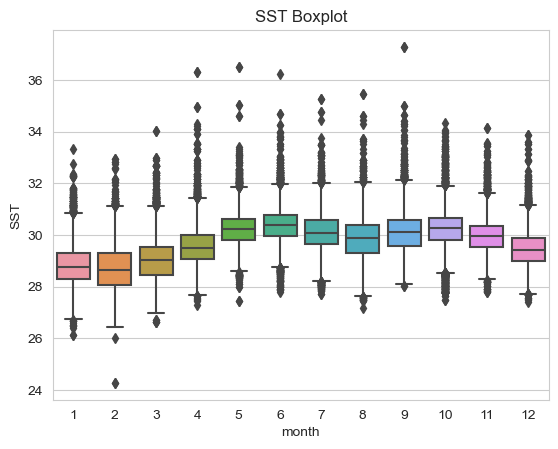

In [39]:
#make boxplot to identify characteristics of sst data
ax = sns.boxplot(x="month", y="sst", data=gdf_sst)

# Rotate x-axis labels by 45 degrees
ax.set_xticklabels(ax.get_xticklabels())

# Add title and y-axis label
ax.set_title('SST Boxplot')
ax.set_ylabel('SST')

# Show plot
plt.show()

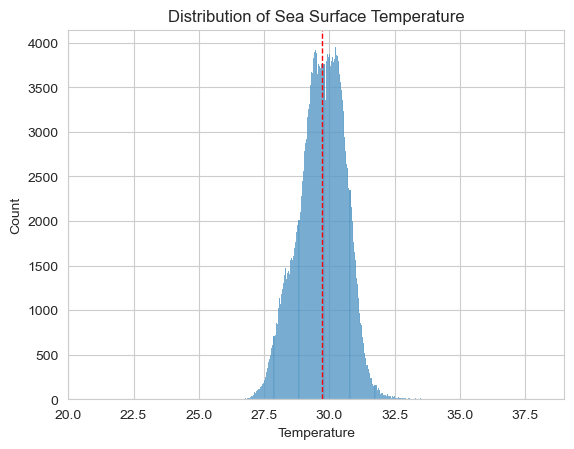

In [40]:
# Assuming you have loaded your data into a GeoDataFrame called 'gdf'
sst_data = gdf_sst['sst']

# Calculate mean and standard deviation of the data
mean_sst = sst_data.mean()
std_sst = sst_data.std()

# Plot histogram using Seaborn
sns.histplot(data=sst_data, kde=False)

# Add vertical line at mean
plt.axvline(mean_sst, color='r', linestyle='dashed', linewidth=1)

# Add normal distribution curve
sns.lineplot(x=x, y=y, color='k', linewidth=2)

# Set x-axis limits to 0-1
plt.xlim([20, 39])

# Add labels and title
plt.xlabel('Temperature')
plt.ylabel('Count')
plt.title('Distribution of Sea Surface Temperature')

# Display plot
plt.show()


<Axes: xlabel='month', ylabel='sst'>

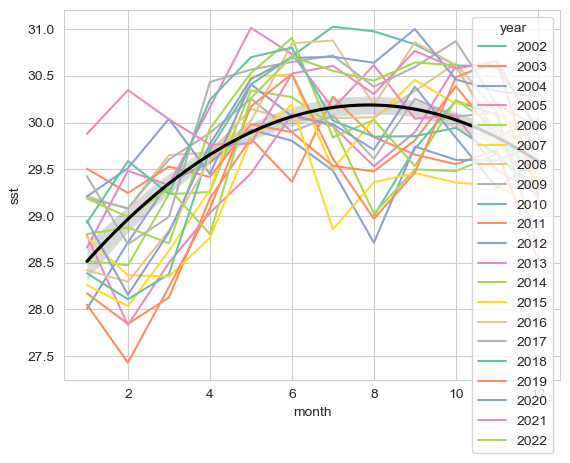

In [41]:
# Compute mean SSC for each year and month
grpd_gdf_mean_sst = gdf_sst.groupby(['year', 'month'])['sst'].mean().reset_index()

# Create line plot with seaborn
sns.set_style('whitegrid')
sns.lineplot(x='month', y='sst', hue='year', palette = "Set2", data=grpd_gdf_mean_sst)

# Add title and y-axis label
ax.set_title('SST Lineplot')
ax.set_ylabel('Temperature')

# Add curvilinear trend line
sns.regplot(x='month', y='sst', data=grpd_gdf_mean_sst, scatter=False, order=2, color='black')


In [42]:
# copy gdf data to not affect orig data
gdf_sst_copy = gdf_sst.copy()
gdf_sst_copy

,time,lat,lon,sst,geometry,date,year,month
1,2002-08-01,5.645831,125.187523,28.779999,POINT (125.18752 5.64583),2002-08-01,2002,8
2,2002-08-01,5.645831,125.229179,28.740000,POINT (125.22918 5.64583),2002-08-01,2002,8
3,2002-08-01,5.645831,125.270836,28.785000,POINT (125.27084 5.64583),2002-08-01,2002,8
6,2002-08-01,5.645831,125.312523,28.969999,POINT (125.31252 5.64583),2002-08-01,2002,8
11,2002-08-01,5.645831,125.437523,28.994999,POINT (125.43752 5.64583),2002-08-01,2002,8
...,...,...,...,...,...,...,...,...
1175899,2022-10-01,7.645831,126.520844,30.510000,POINT (126.52084 7.64583),2022-10-01,2022,10
1176007,2022-10-01,7.687498,126.479179,30.340000,POINT (126.47918 7.68750),2022-10-01,2022,10
1176009,2022-10-01,7.687498,126.520844,30.429998,POINT (126.52084 7.68750),2022-10-01,2022,10
1176062,2022-10-01,7.729164,126.479179,30.340000,POINT (126.47918 7.72916),2022-10-01,2022,10


In [43]:
# Define the percentile values for Winsorization
lower_percentile = 1
upper_percentile = 99

# Get the lower and upper limits
lower_limit, upper_limit = np.percentile(gdf_sst_copy['sst'], [lower_percentile, upper_percentile])

# Make 'sst' column of the geodataframe with the winsorized data
gdf_sst_copy['sst'] = np.clip(gdf_sst_copy['sst'], lower_limit, upper_limit)

In [44]:
gdf_sst_copy['sst'].describe()

count    227498.000000
mean         29.706486
std           0.873436
min          27.625000
25%          29.129999
50%          29.754999
75%          30.349998
max          31.609999
Name: sst, dtype: float64

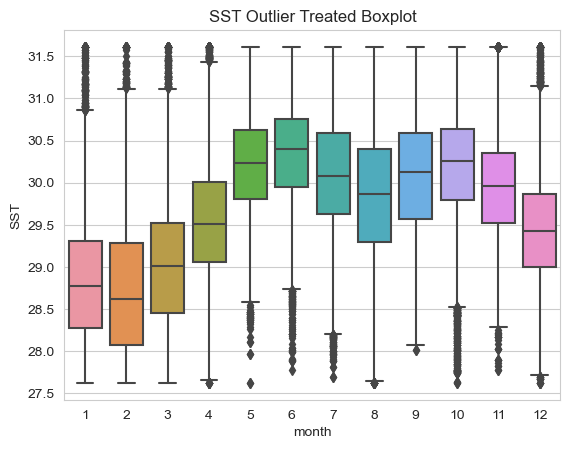

In [45]:
# BOXPLOT
#make boxplot to identify characteristics of sst data
ax = sns.boxplot(x="month", y="sst", data=gdf_sst_copy)

# Rotate x-axis labels by 45 degrees
ax.set_xticklabels(ax.get_xticklabels())

# Add title and y-axis label
ax.set_title('SST Outlier Treated Boxplot')
ax.set_ylabel('SST')

# Show plot
plt.show()

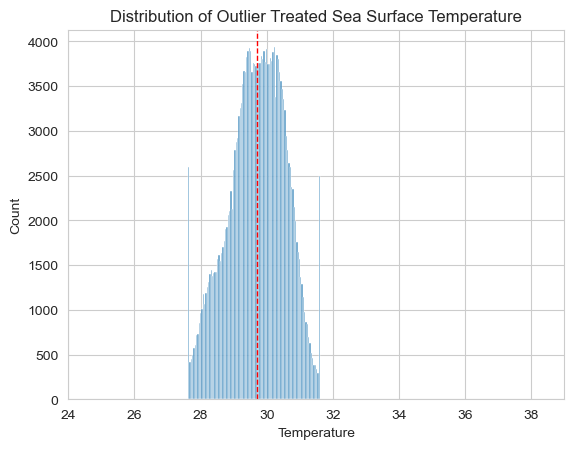

In [46]:
# HISTOGRAM
# Assuming you have loaded your data into a GeoDataFrame called 'gdf'
sst_data_copy = gdf_sst_copy['sst']

# Calculate mean and standard deviation of the data
mean_sst_copy = sst_data_copy.mean()
std_sst_copy = sst_data_copy.std()

# Plot histogram using Seaborn
sns.histplot(data=sst_data_copy, kde=False)

# Add vertical line at mean
plt.axvline(mean_sst_copy, color='r', linestyle='dashed', linewidth=1)

# Add normal distribution curve
sns.lineplot(x=x, y=y, color='k', linewidth=2)

# Set x-axis limits to 0-1
plt.xlim([24, 39])

# Add labels and title
plt.xlabel('Temperature')
plt.ylabel('Count')
plt.title('Distribution of Outlier Treated Sea Surface Temperature')

# Display plot
plt.show()


<Axes: xlabel='month', ylabel='sst'>

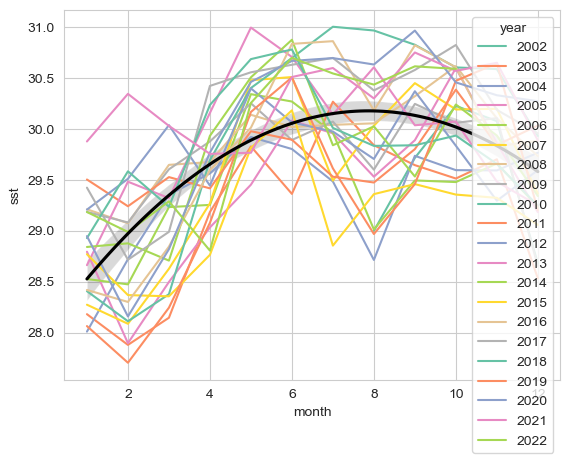

In [47]:
# LINEPLOT
# Compute mean SSC for each year and month
grpd_gdf_mean_sst_copy = gdf_sst_copy.groupby(['year', 'month'])['sst'].mean().reset_index()

# Create line plot with seaborn
sns.set_style('whitegrid')
sns.lineplot(x='month', y='sst', hue='year', palette = "Set2", data=grpd_gdf_mean_sst_copy)

# Add title and y-axis label
ax.set_title('SST Outlier Treated Lineplot')
ax.set_ylabel('Temperature')

# Add curvilinear trend line
sns.regplot(x='month', y='sst', data=grpd_gdf_mean_sst_copy, scatter=False, order=2, color='black')
